In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
import skimage
import time, sys
from IPython.display import clear_output

def show(img, *masks):
    global width
    global height
    try:
        if(img.shape[2] == 1):
            plt.imshow(img.reshape(width, height), vmin=0, vmax=1)
        else:
            plt.imshow(img, vmin=0, vmax=1)
    except:
        plt.imshow(img, vmin=0, vmax=1)
    for mask in masks:
        plt.imshow(mask.reshape(width, height), alpha=0.4, vmin=0, vmax=1)
    plt.show()

def update_progress(progress):
    bar_length = 20
    if isinstance(progress, int):
        progress = float(progress)
    if not isinstance(progress, float):
        progress = 0
    if progress < 0:
        progress = 0
    if progress >= 1:
        progress = 1
    block = int(round(bar_length * progress))
    clear_output(wait = True)
    text = "Progress: [{0}] {1:.1f}%".format( "#" * block + "-" * (bar_length - block), progress * 100)
    print(text)

In [ ]:
import os
import cv2
import imageio
import numpy as np
from PIL import Image
from skimage import color, io
from sklearn.model_selection import train_test_split

mdirectory = "training/data/resized_masks"
idirectory = "training/data/resized_images"

length = len(os.listdir(mdirectory))
width = 224
height = 224

masks = []
images = []

for number, path in enumerate(os.listdir(mdirectory)):
    _, threshed = cv2.threshold(cv2.imread(os.path.join(mdirectory, path), 0), 127, 255, cv2.THRESH_BINARY)
    masks.append(threshed.reshape(224, 224, 1).astype("float32") / 255)
    images.append(cv2.imread(os.path.join(idirectory, path)).astype("float32") / 255)
    update_progress(number / length)
X_train, X_test, y_train, y_test = train_test_split(np.array(images), np.array(masks), test_size=0.2)

Progress: [####################] 99.9%


In [ ]:
from scipy import ndimage
from sklearn.preprocessing import minmax_scale
import matplotlib.pyplot as plt

def find_path(mask):
    num_horizontal_windows = 2
    horizontal_window_size = int(width / num_horizontal_windows)

    path_scores = []
    for horizontal_num in range(num_horizontal_windows):
        current_slice = mask[0:height, horizontal_num * horizontal_window_size:(horizontal_num + 1) * horizontal_window_size]
        path_scores.append(np.average(current_slice))
    return path_scores[1] - path_scores[0]
directions = []
for number, mask in enumerate(y_train):
    mask = mask.reshape(width, height)
    directions.append(find_path(mask))
    update_progress(number / len(y_train))
directions = minmax_scale(np.asarray(directions).astype('float32'), feature_range=(0, 1), axis=0, copy=True)

Progress: [####################] 99.9%


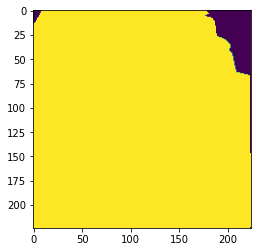

0.40497229


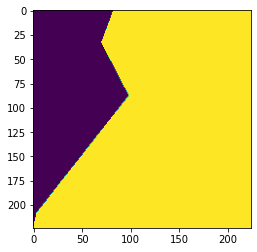

0.78853667


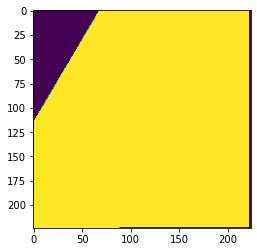

0.5394636


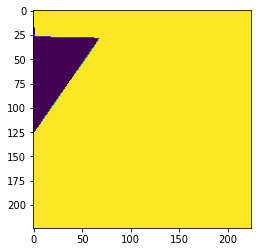

0.5395652


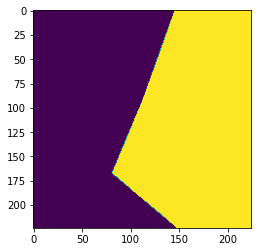

0.9950733


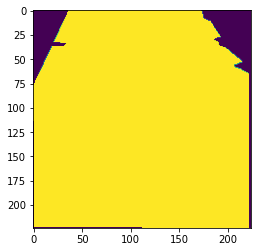

0.43834117


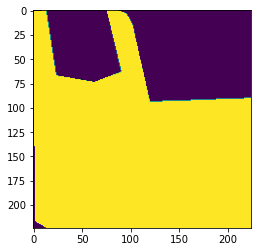

0.32700998


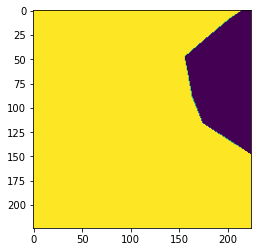

0.27748996


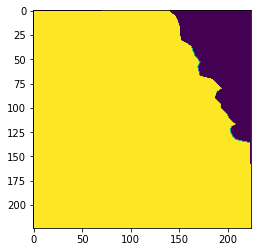

0.2975773


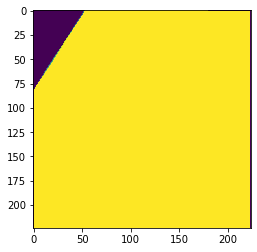

0.5042155


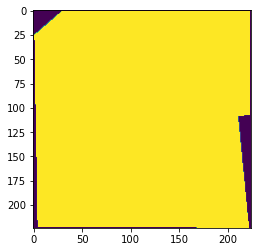

0.4524607


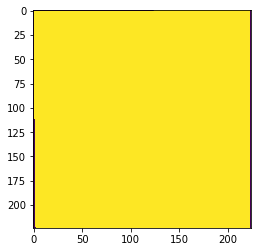

0.4566001


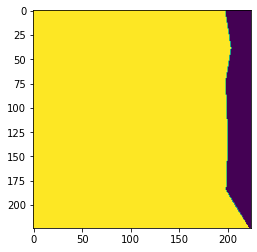

0.32396257


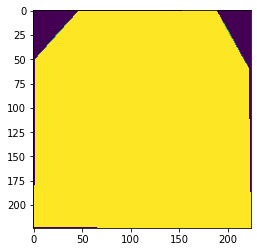

0.4595967


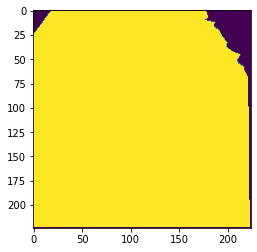

0.40720704


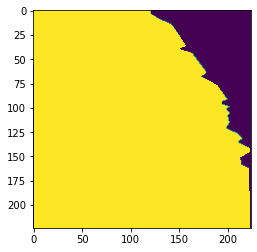

0.28277206


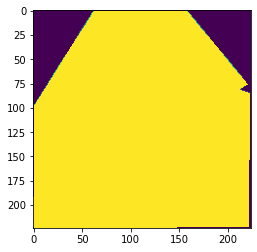

0.45728576


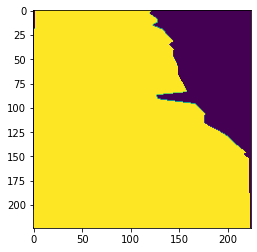

0.2075778


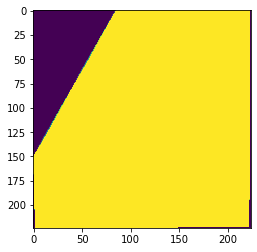

0.6075219


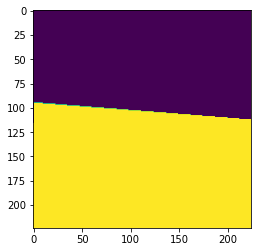

0.42658332


In [ ]:
for i in range(20):
    show(y_train[i])
    print(directions[i])

(array([ 3.,  3.,  3.,  1.,  2.,  0.,  3.,  3.,  5.,  3.,  8.,  8.,  7.,
        13., 20., 13., 15., 23., 22., 33., 47., 52., 94., 61., 55., 39.,
        31., 25., 35., 25., 12., 11.,  8.,  3.,  2.,  3.,  2.,  7.,  2.,
         6.,  1.,  2.,  0.,  0.,  1.,  0.,  0.,  0.,  2.,  2.]),
 array([0.        , 0.02      , 0.04      , 0.05999999, 0.07999999,
        0.09999999, 0.11999998, 0.13999999, 0.15999998, 0.17999998,
        0.19999997, 0.21999997, 0.23999996, 0.25999996, 0.27999997,
        0.29999995, 0.31999996, 0.33999997, 0.35999995, 0.37999997,
        0.39999995, 0.41999996, 0.43999994, 0.45999995, 0.47999993,
        0.49999994, 0.5199999 , 0.53999996, 0.55999994, 0.5799999 ,
        0.5999999 , 0.61999995, 0.6399999 , 0.6599999 , 0.67999995,
        0.6999999 , 0.7199999 , 0.7399999 , 0.75999993, 0.7799999 ,
        0.7999999 , 0.8199999 , 0.8399999 , 0.8599999 , 0.8799999 ,
        0.8999999 , 0.9199999 , 0.9399999 , 0.95999986, 0.9799999 ,
        0.9999999 ], dtype=float32),

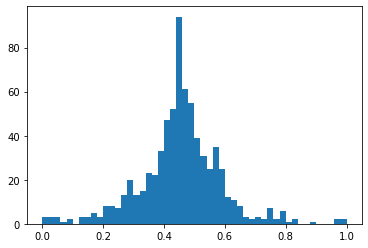

In [ ]:
plt.hist(directions, bins=50)

In [ ]:
from tensorflow.keras.layers import *
from tensorflow.keras.models import *

input_img = Input(shape=(width, height, 3), name='unet_input')

c1 = Conv2D(4, (3, 3), activation='relu', padding='same') (input_img)
a1 = MaxPooling2D((2, 2))(c1)
c1 = Dropout(0.2)(c1)
c1 = Conv2D(4, (3, 3), activation='relu', padding='same') (c1)
p1 = MaxPooling2D((2, 2)) (c1)

cat1 = concatenate([p1, a1])

c2 = Conv2D(8, (3, 3), activation='relu', padding='same') (cat1)
a2 = MaxPooling2D((2, 2))(c2)
c2 = Dropout(0.2)(c2)
c2 = Conv2D(8, (3, 3), activation='relu', padding='same') (c2)
p2 = MaxPooling2D((2, 2)) (c2)

cat2 = concatenate([p2, a2])

c3 = Conv2D(16, (3, 3), activation='relu', padding='same') (cat2)
a3 = MaxPooling2D((2, 2))(c3)
c3 = Dropout(0.2)(c3)
c3 = Conv2D(16, (3, 3), activation='relu', padding='same') (c3)
p3 = MaxPooling2D((2, 2)) (c3)

cat3 = concatenate([p3, a3])

c4 = Conv2D(32, (3, 3), activation='relu', padding='same') (cat3)
a4 = MaxPooling2D((2, 2))(c4)
c4 = Dropout(0.2)(c4)
c4 = Conv2D(32, (3, 3), activation='relu', padding='same') (c4)
p4 = MaxPooling2D((2, 2)) (c4)

cat4 = concatenate([p4, a4])

c5 = Conv2D(64, (3, 3), activation='relu', padding='same') (cat4)
a5 = MaxPooling2D((2, 2))(c5)
c5 = Dropout(0.2)(c5)
c5 = Conv2D(64, (3, 3), activation='relu', padding='same') (c5)
p5 = MaxPooling2D((2, 2)) (c5)

cat5 = concatenate([p5, a5])

c6 = Conv2D(128, (3, 3), activation='relu', padding='same') (cat5)
c6 = Dropout(0.2)(c6)
c6 = Conv2D(128, (3, 3), activation='relu', padding='same') (c6)

u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c6)
u7 = concatenate([u7, c5])
c7 = Conv2D(64, (3, 3), activation='relu', padding='same') (u7)
c7 = Dropout(0.2)(c7)
c7 = Conv2D(64, (3, 3), activation='relu', padding='same') (c7)

u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (c7)
u8 = concatenate([u8, c4])
c8 = Conv2D(32, (3, 3), activation='relu', padding='same') (u8)
c8 = Dropout(0.2)(c8)
c8 = Conv2D(32, (3, 3), activation='relu', padding='same') (c8)

u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same') (c8)
u9 = concatenate([u9, c3])
c9 = Conv2D(16, (3, 3), activation='relu', padding='same') (u9)
c9 = Dropout(0.2)(c9)
c9 = Conv2D(16, (3, 3), activation='relu', padding='same') (c9)

u10 = Conv2DTranspose(8, (2, 2), strides=(2, 2), padding='same') (c9)
u10 = concatenate([u10, c2])
c10 = Conv2D(8, (3, 3), activation='relu', padding='same') (u10)
c10 = Dropout(0.2)(c10)
c10 = Conv2D(8, (3, 3), activation='relu', padding='same') (c10)

u11 = Conv2DTranspose(4, (2, 2), strides=(2, 2), padding='same') (c10)
u11 = concatenate([u11, c1], axis = 3)
c11 = Conv2D(4, (3, 3), activation='relu', padding='same') (u11)
c11 = Dropout(0.2)(c11)
c11 = Conv2D(4, (3, 3), activation='relu', padding='same') (c11)

unet_output = Conv2D(1, (1, 1), activation='sigmoid', name='unet_output') (c11)

unet_model = Model(inputs=input_img, outputs=unet_output, name='unet_model')
unet_model.summary()

Model: "unet_model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
unet_input (InputLayer)         [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d_44 (Conv2D)              (None, 224, 224, 4)  112         unet_input[0][0]                 
__________________________________________________________________________________________________
dropout_22 (Dropout)            (None, 224, 224, 4)  0           conv2d_44[0][0]                  
__________________________________________________________________________________________________
conv2d_45 (Conv2D)              (None, 224, 224, 4)  148         dropout_22[0][0]                 
_________________________________________________________________________________________

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow.keras.backend as K

bs = 16
SEED = 100

train_datagen = ImageDataGenerator(
    shear_range=0.1,
    zoom_range=0.1,
    rotation_range=7)

train_image_generator = train_datagen.flow(X_train, batch_size=bs, seed=SEED)

train_mask_generator = train_datagen.flow(y_train, batch_size=bs, seed=SEED)

train_generator = zip(train_image_generator, train_mask_generator)

def dice_coeff(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    return score

def dice_loss(y_true, y_pred):
    loss = 1 - dice_coeff(y_true, y_pred)
    return loss

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint
mcp = ModelCheckpoint('unet_model.h5', save_best_only=True, monitor='loss')

unet_model.compile(optimizer='adam', loss="binary_crossentropy", metrics=dice_loss)
unet_results = unet_model.fit(X_train, y_train, epochs=350, batch_size=bs, callbacks=[mcp])

Epoch 1/350
168/168 [==============================] - 6s 37ms/step - loss: 0.3535 - dice_loss: 0.1362
Epoch 2/350
168/168 [==============================] - 6s 37ms/step - loss: 0.2456 - dice_loss: 0.0857
Epoch 3/350
168/168 [==============================] - 6s 37ms/step - loss: 0.1902 - dice_loss: 0.0619
Epoch 4/350
168/168 [==============================] - 6s 37ms/step - loss: 0.1663 - dice_loss: 0.0530
Epoch 5/350
168/168 [==============================] - 6s 37ms/step - loss: 0.1495 - dice_loss: 0.0480
Epoch 6/350
168/168 [==============================] - 6s 37ms/step - loss: 0.1237 - dice_loss: 0.0383
Epoch 7/350
168/168 [==============================] - 6s 35ms/step - loss: 0.1250 - dice_loss: 0.0386
Epoch 8/350
168/168 [==============================] - 6s 37ms/step - loss: 0.1076 - dice_loss: 0.0333
Epoch 9/350
168/168 [==============================] - 6s 37ms/step - loss: 0.0955 - dice_loss: 0.0303
Epoch 10/350
168/168 [==============================] - 6s 37ms/step - lo

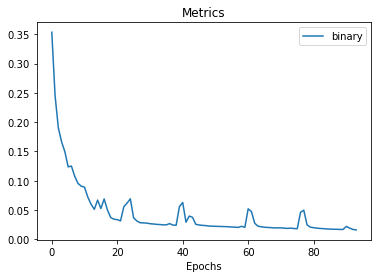

In [ ]:
plt.title("Metrics")
plt.plot(unet_results.history["loss"], label="binary")
plt.xlabel("Epochs")
plt.legend()

In [ ]:
from tensorflow.keras.models import load_model
dependencies = {
    'dice_loss': dice_loss
}
unet_model = load_model("./unet_model.h5", custom_objects=dependencies)

In [ ]:
for layer in unet_model.layers:
    layer.trainable = False

In [ ]:
from tensorflow.keras.layers import *
from tensorflow.keras.models import *

c1 = Conv2D(8, (3, 3)) (unet_model.layers[-1].output)
a1 = Activation('relu') (c1)
p1 = MaxPool2D(pool_size=(2,2)) (a1)

c2 = Conv2D(16, (3, 3)) (p1)
a2 = Activation('relu') (c2)
p2 = MaxPool2D(pool_size=(2,2)) (a2)

c3 = Conv2D(32, (3, 3)) (p2)
a3 = Activation('relu') (c3)
p3 = MaxPool2D(pool_size=(2,2)) (a3)

c4 = Conv2D(64, (3, 3)) (p3)
a4 = Activation('relu') (c4)
p4 = MaxPool2D(pool_size=(2,2)) (a4)

c5 = Conv2D(128, (2, 2)) (p4)
a5 = Activation('relu') (c5)
p5 = MaxPool2D(pool_size=(2,2)) (a5)

flattened = Flatten() (p5)
dense64 = Dense(64) (flattened)
act = Activation('relu') (dense64)
drop = Dropout(0.25) (act)
dense1 = Dense(1) (drop)
direction_output = Activation('sigmoid', name='output') (dense1)

direction_model = Model(inputs=unet_model.layers[0].output, outputs=direction_output, name='direction_model')
direction_model.summary()

Model: "direction_model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
unet_input (InputLayer)         [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d_44 (Conv2D)              (None, 224, 224, 4)  112         unet_input[0][0]                 
__________________________________________________________________________________________________
dropout_22 (Dropout)            (None, 224, 224, 4)  0           conv2d_44[0][0]                  
__________________________________________________________________________________________________
conv2d_45 (Conv2D)              (None, 224, 224, 4)  148         dropout_22[0][0]                 
____________________________________________________________________________________

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint
mcp = ModelCheckpoint('direction_model.h5', save_best_only=True, monitor='loss')

direction_model.compile(optimizer='adam', loss='mse')
full_results = direction_model.fit(x=X_train, y=directions, epochs=50, batch_size=16, callbacks=[mcp])

Epoch 1/50
45/45 [==============================] - 1s 32ms/step - loss: 0.0069 - accuracy: 0.0014
Epoch 2/50
45/45 [==============================] - 1s 28ms/step - loss: 0.0018 - accuracy: 0.0014
Epoch 3/50
45/45 [==============================] - 1s 28ms/step - loss: 0.0012 - accuracy: 0.0014
Epoch 4/50
45/45 [==============================] - 1s 21ms/step - loss: 0.0013 - accuracy: 0.0014
Epoch 5/50
45/45 [==============================] - 1s 27ms/step - loss: 0.0011 - accuracy: 0.0014
Epoch 6/50
45/45 [==============================] - 1s 27ms/step - loss: 0.0010 - accuracy: 0.0014
Epoch 7/50
45/45 [==============================] - 1s 26ms/step - loss: 8.9484e-04 - accuracy: 0.0014
Epoch 8/50
45/45 [==============================] - 1s 27ms/step - loss: 8.5327e-04 - accuracy: 0.0014
Epoch 9/50
45/45 [==============================] - 1s 21ms/step - loss: 8.8396e-04 - accuracy: 0.0014
Epoch 10/50
45/45 [==============================] - 1s 27ms/step - loss: 6.0251e-04 - accuracy: 

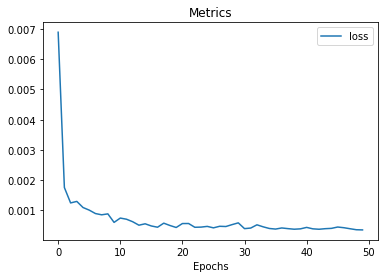

In [ ]:
plt.title("Metrics")
plt.plot(full_results.history["loss"], label="loss")
plt.xlabel("Epochs")
plt.legend()

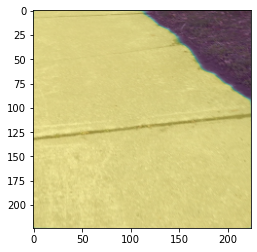

[[0.32767016]]


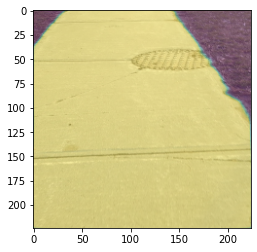

[[0.35899636]]


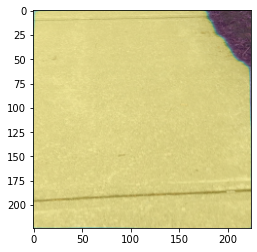

[[0.4179013]]


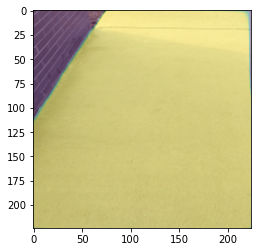

[[0.5586301]]


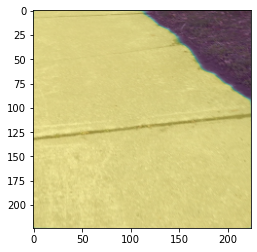

[[0.32767016]]


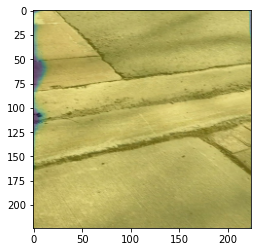

[[0.45540974]]


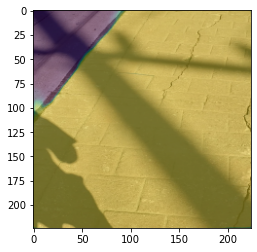

[[0.5919875]]


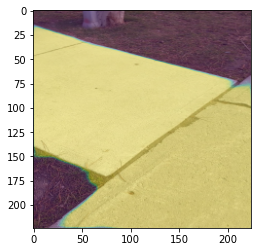

[[0.4423762]]


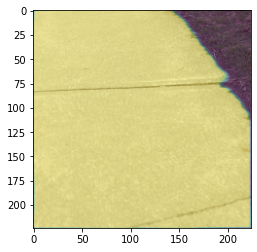

[[0.36558416]]


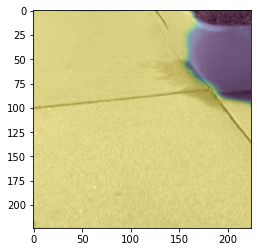

[[0.34004095]]


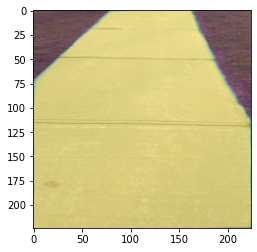

[[0.44169295]]


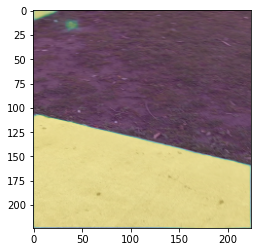

[[0.40695786]]


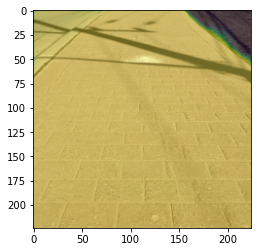

[[0.41511256]]


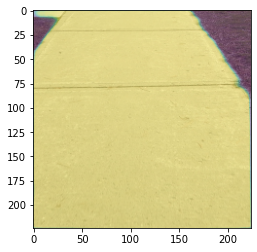

[[0.3991107]]


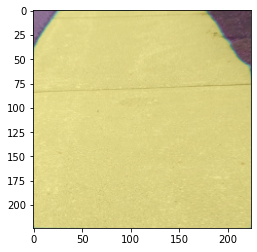

[[0.42571446]]


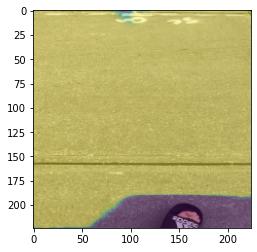

[[0.4224094]]


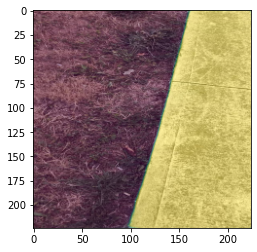

[[0.9153578]]


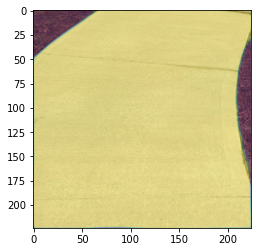

[[0.48483866]]


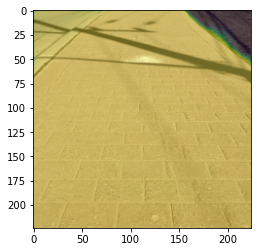

[[0.41511256]]


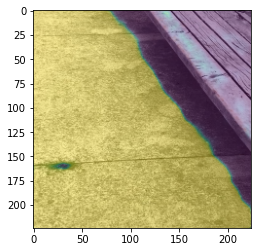

[[0.14002053]]


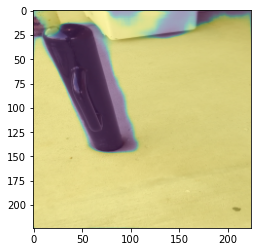

[[0.62160474]]


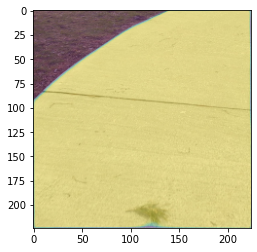

[[0.58076155]]


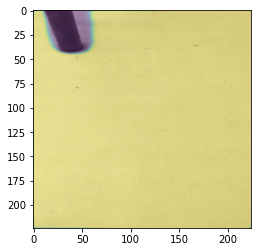

[[0.5114161]]


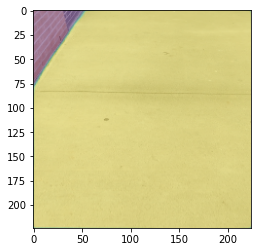

[[0.5007608]]


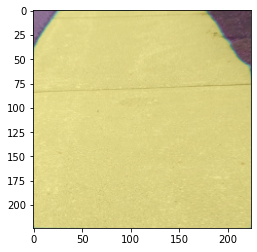

[[0.42571446]]


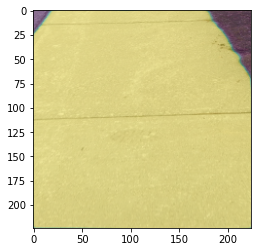

[[0.42491674]]


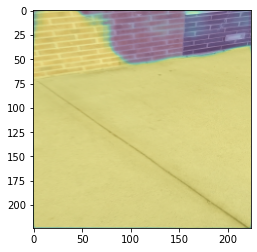

[[0.3761988]]


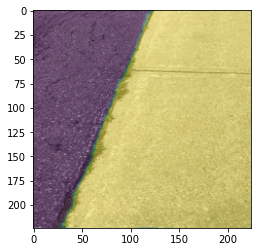

[[0.8527917]]


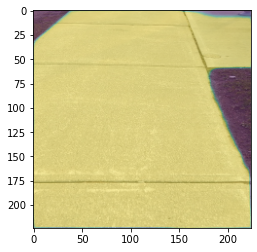

[[0.41253534]]


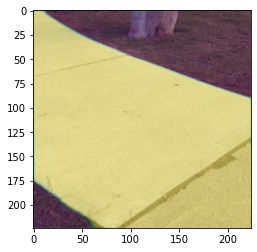

[[0.35953543]]


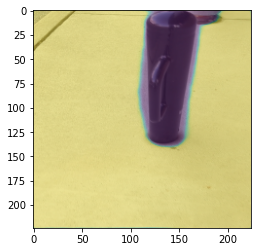

[[0.3389607]]


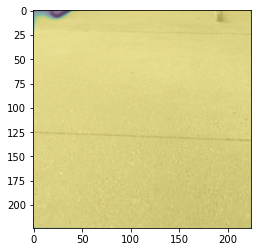

[[0.45294416]]


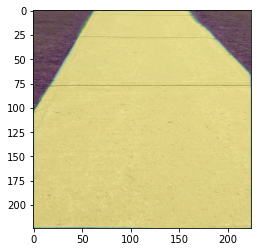

[[0.48010913]]


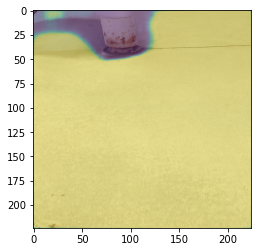

[[0.5248568]]


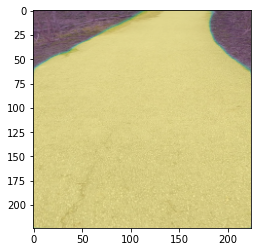

[[0.48192832]]


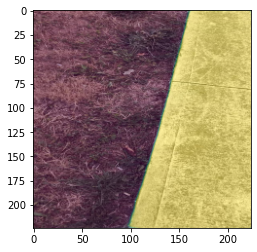

[[0.9153578]]


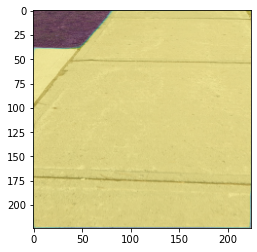

[[0.5171605]]


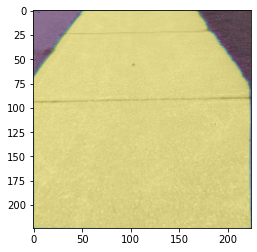

[[0.4503412]]


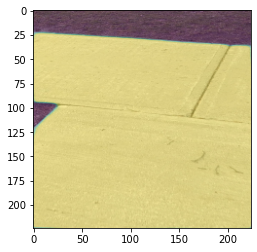

[[0.43822896]]


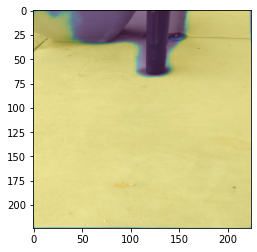

[[0.4523935]]


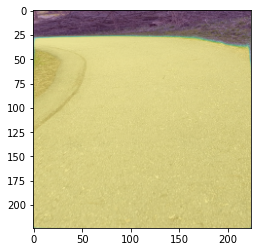

[[0.44126305]]


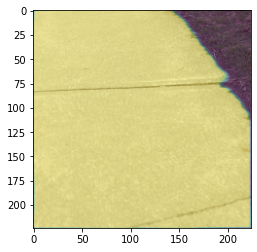

[[0.36558416]]


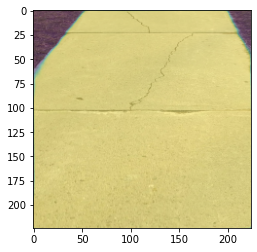

[[0.4924589]]


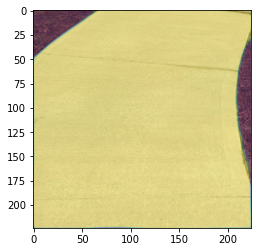

[[0.48483866]]


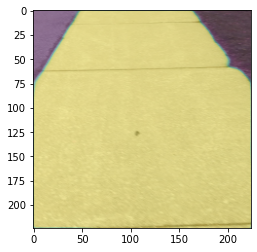

[[0.44568107]]


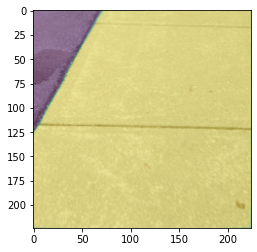

[[0.56734896]]


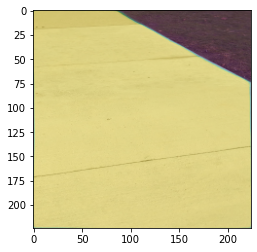

[[0.33712614]]


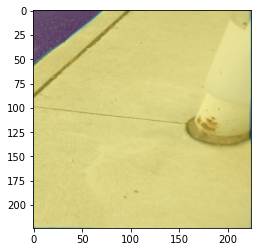

[[0.49754012]]


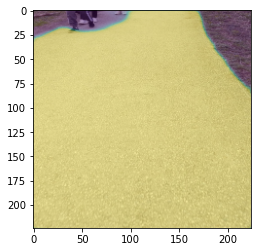

[[0.43305144]]


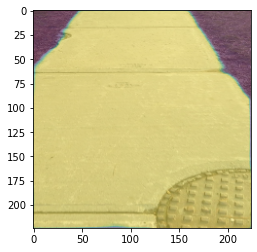

[[0.42340845]]


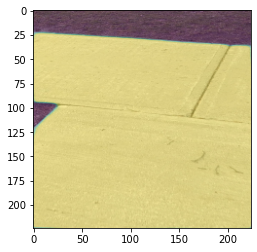

[[0.43822896]]


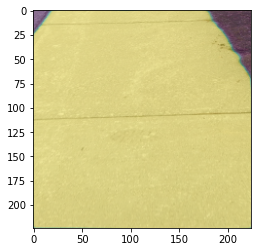

[[0.42491674]]


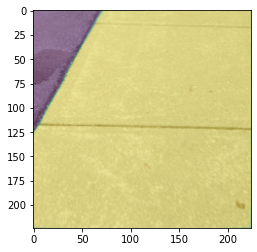

[[0.56734896]]


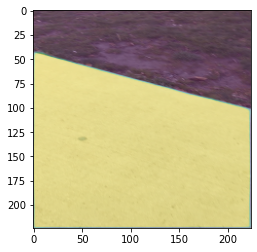

[[0.38055786]]


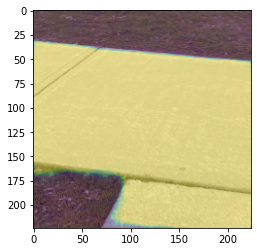

[[0.50151247]]


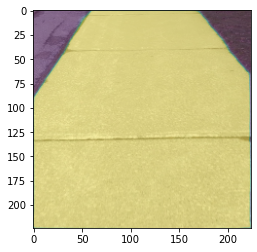

[[0.47239333]]


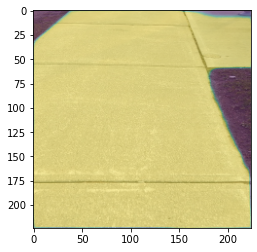

[[0.41253534]]


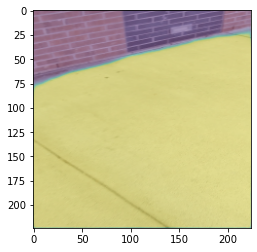

[[0.53266305]]


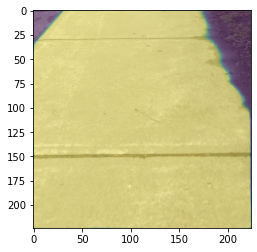

[[0.40619424]]


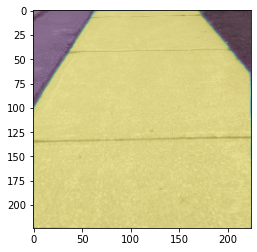

[[0.48507497]]


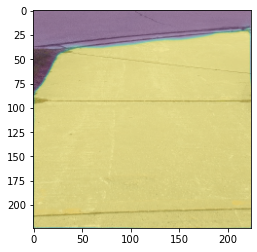

[[0.5031111]]


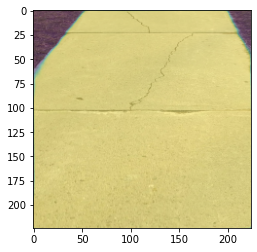

[[0.4924589]]


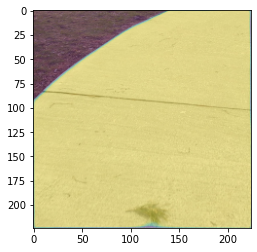

[[0.58076155]]


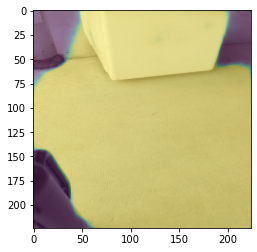

[[0.5106499]]


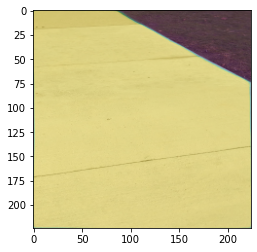

[[0.33712614]]


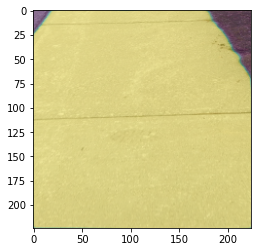

[[0.42491674]]


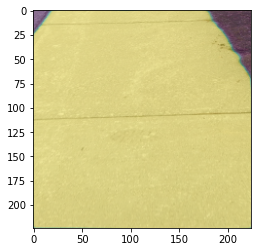

[[0.42491674]]


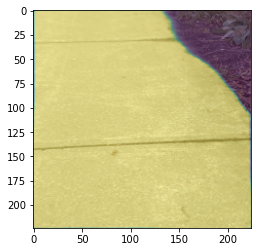

[[0.33825195]]


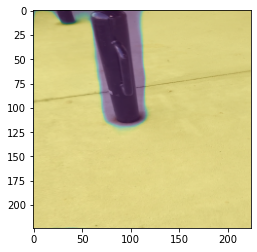

[[0.5660431]]


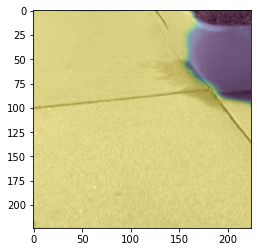

[[0.34004095]]


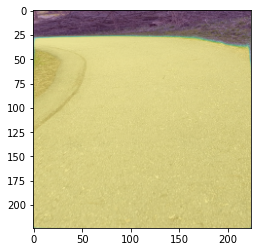

[[0.44126305]]


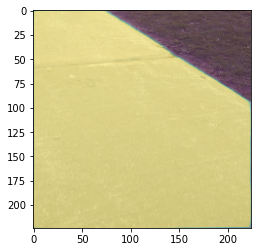

[[0.3045079]]


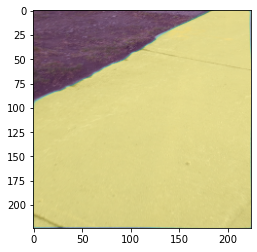

[[0.60558]]


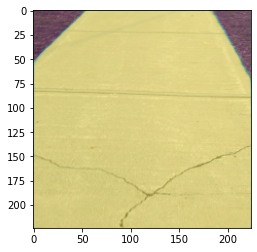

[[0.45499888]]


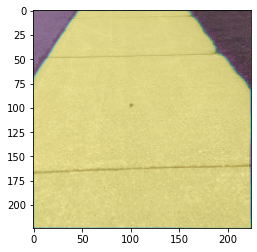

[[0.4330837]]


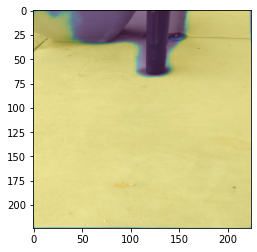

[[0.4523935]]


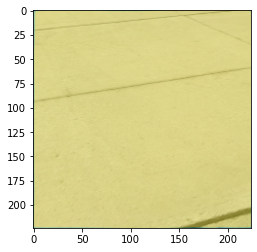

[[0.45260227]]


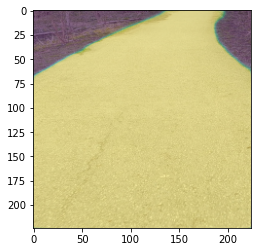

[[0.5133189]]


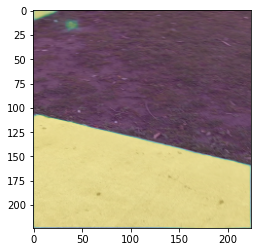

[[0.40695786]]


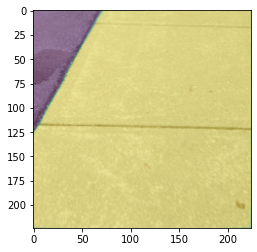

[[0.56734896]]


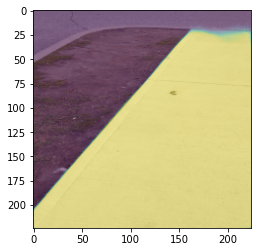

[[0.7772725]]


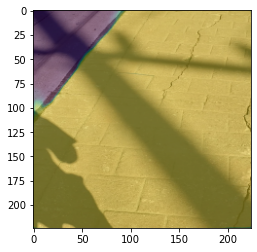

[[0.5919875]]


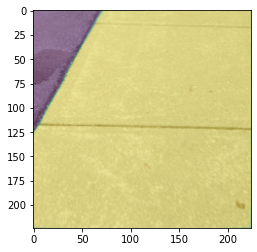

[[0.56734896]]


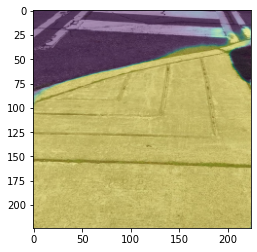

[[0.54125965]]


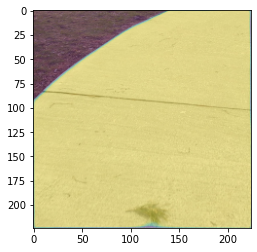

[[0.58076155]]


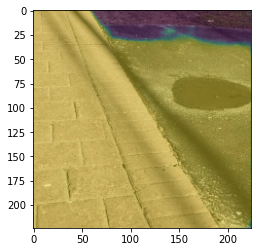

[[0.40530574]]


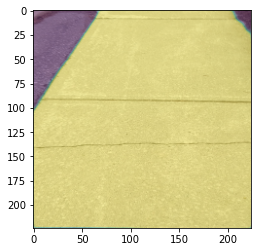

[[0.5419717]]


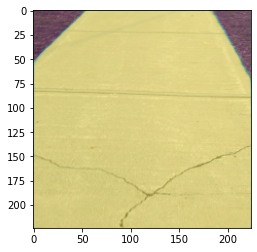

[[0.45499888]]


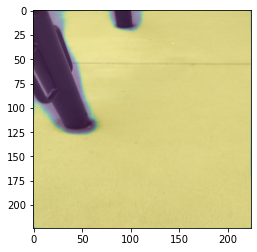

[[0.5492607]]


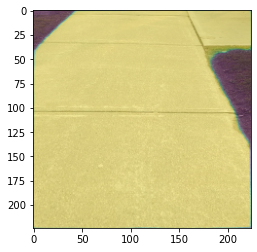

[[0.42686403]]


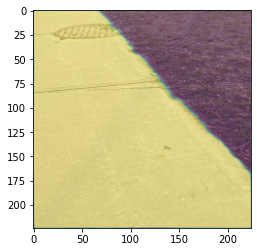

[[0.17760117]]


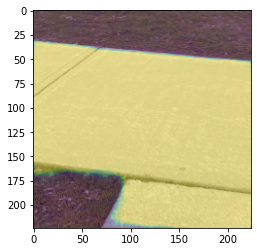

[[0.50151247]]


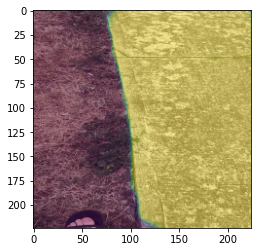

[[0.94886434]]


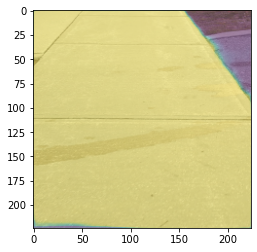

[[0.39359233]]


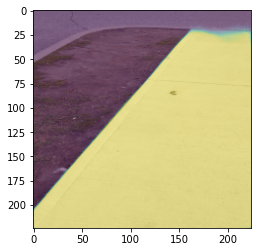

[[0.7772725]]


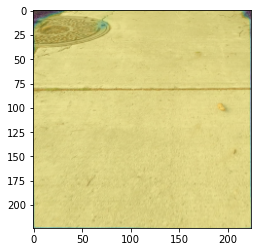

[[0.45265076]]


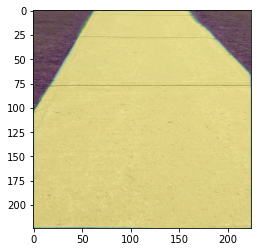

[[0.48010913]]


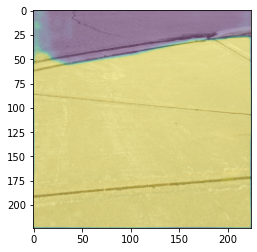

[[0.50876313]]


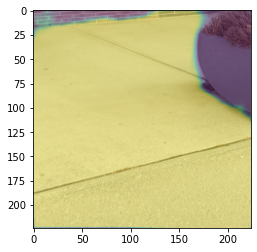

[[0.3548642]]


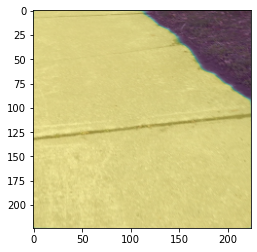

[[0.32767016]]


In [ ]:
import random

for counter in range(100):
    i = random.randint(0, len(X_test) - 1)
    prediction = unet_model.predict(X_test[i].reshape(1, width, height, 3))
    show(X_test[i], prediction[0])
    direct = direction_model.predict(X_test[i].reshape(1, width, height, 3))
    print(direct)